In [1]:
import networkx as nx
import matplotlib.pyplot as plt
import scipy

import numpy as np
import scipy.sparse as sp
import scipy.sparse.linalg as spln
from scipy.linalg import eigh
from scipy.spatial import Delaunay

from networkx.linalg.laplacianmatrix import laplacian_matrix as lap

import urllib.request as urllib
import scipy.io as io
import zipfile

In [2]:
# load the data from the SuiteSparse Matrix Collection format
#   https://www.cise.ufl.edu/research/sparse/matrices/DIMACS10/fe_4elt2.html

graph_names = ['data.mat', 'delaunay_n13.mat', 'fe_4elt2.mat',  'cs4.mat', 'fe_sphere.mat', 
                't60k.mat',  'fe_tooth.mat', '598a.mat', '144.mat']
list_of_graphs = []
for name in graph_names:
    mat_data = io.loadmat('graphs/'+ name)
    graph = mat_data['Problem']['A'][0][0]
    list_of_graphs.append(graph)

In [3]:
#Hall's algorithm
def Hall(A, name):
    diag = np.sum(A, axis=0)
    D = sp.diags(diag, [0], shape=A.shape, format='csc')
    L = D - A
    
    E = spln.eigsh(L, k = 3, which='SM')
    v2, v3 = E[1][:, 1], E[1][:, 2]
    
    spectral_coordinates = [(v2[i], v3[i]) for i in range(len(v2))]

    return spectral_coordinates

In [4]:
#Algorithm for computing degree-normalized eigenvectors (Koren’s algorithm with minor changes)

def koren(A):
    diag = np.sum(A, axis=0)
    diag = [1 / i for i in diag]
    D = sp.diags(diag, [0], shape=A.shape, format='csc')
    D_inv = D
    M = 0.5 * (sp.identity(A.shape[0]) + D_inv @ A)
    u = np.zeros((3, A.shape[0]))
    u[0] = np.ones(A.shape[0])
    for k in range(1, 3):
        v = np.random.rand(A.shape[0])
        v = v / np.linalg.norm(v, 2)
        
        while True:
            u[k] = v
            for l in range(k):
                u[k] = u[k] - (u[k] @ D @ u[l]) / (u[l] @ D @ u[l]) * u[l]
            v = M @ u[k]
            v = v / np.linalg.norm(v, 2)
            if np.linalg.norm(v - u[k], 2) < 1e-4:
                break
        u[k] = v

    spectral_coordinates = [(u[1][i], u[2][i]) for i in range(A.shape[0])]
    return spectral_coordinates

In [5]:
# Tutte algorithm

import numpy as np
import networkx as nx
import numpy.linalg as la
import matplotlib.pyplot as plt
 
def tutte(G, edges):
    pos = {}
    graph = nx.Graph()
    for edge in edges:
        graph.add_edge(edge[0],edge[1])
    graph_pos = nx.spectral_layout(graph) 
    pos.update(graph_pos)
    nodes_out = graph.nodes()
    nodes_stay = []
    for node in G.nodes:
        if node not in nodes_out:
            nodes_stay.append(node)
    length = len(nodes_stay)
 
    left_1 = np.zeros((length, length))
    left_2 = np.zeros((length, length))
    ans_1 = np.zeros(length)
    ans_2 = np.zeros(length)
 
    for node_ in nodes_stay:
        node_index = nodes_stay.index(node_)
        neighbors = G.neighbors(node_)
        n = len(list(neighbors))
        left_1[node_index][node_index] = 1
        left_2[node_index][node_index] = 1
        for nnode_ in neighbors:
            if nnode_ in nodes_out:
                ans_1[node_index] += pos[nnode_][0]/n
                ans_2[node_index] += pos[nnode_][1]/n
            else:
                node_index_ = nodes_stay.index(nnode_)
                left_1[node_index][node_index_] = -(1/n)
                left_2[node_index][node_index_] = -(1/n)
    x = la.solve(left_1, ans_1)
    y = la.solve(left_2, ans_2)
    for node1_ in nodes_stay:
        node_ind = nodes_stay.index(node1_)
        pos[node1_] = [x[node_ind],y[node_ind]]
 
    return pos

In [6]:
import pickle

def save_obj(obj, name):
    with open(name + '.pkl', 'wb') as f:
        pickle.dump(obj, f, pickle.HIGHEST_PROTOCOL)

### Hall's algorithm for different eigenvectors

In [7]:
def Hall_different(A, n, m):
    diag = np.sum(A, axis=0)
    D = sp.diags(diag, [0], shape=A.shape, format='csc')
    L = D - A
    
    E = spln.eigsh(L, k = 5, which='SM')
    v_n, v_m = E[1][:, n-1], E[1][:, m-1]
    
    spectral_coordinates = [(v_n[i], v_m[i]) for i in range(len(v_n))]

    return spectral_coordinates

In [8]:
def draw_different_eig(G, i, n, m):
    graph = nx.from_scipy_sparse_matrix(G)
    
    pos_Hall = Hall_different(G, n, m)
    
    f = plt.figure(figsize=(10, 10))
    nx.draw(graph, pos=pos_Hall, **options)
    name = graph_names[i].split('.')[0]
    f.savefig(f"images/{name}_{n}_{m}.png")
    plt.show()

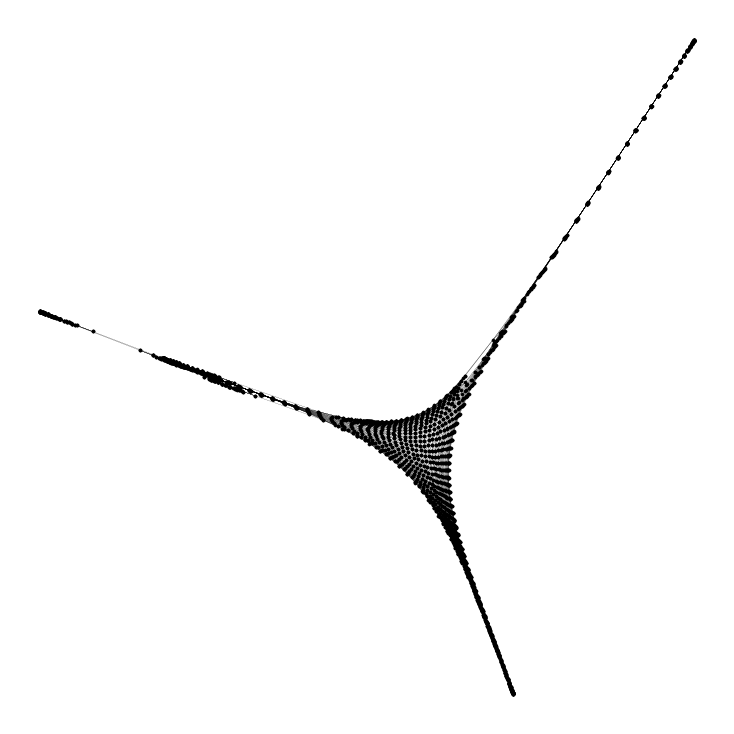

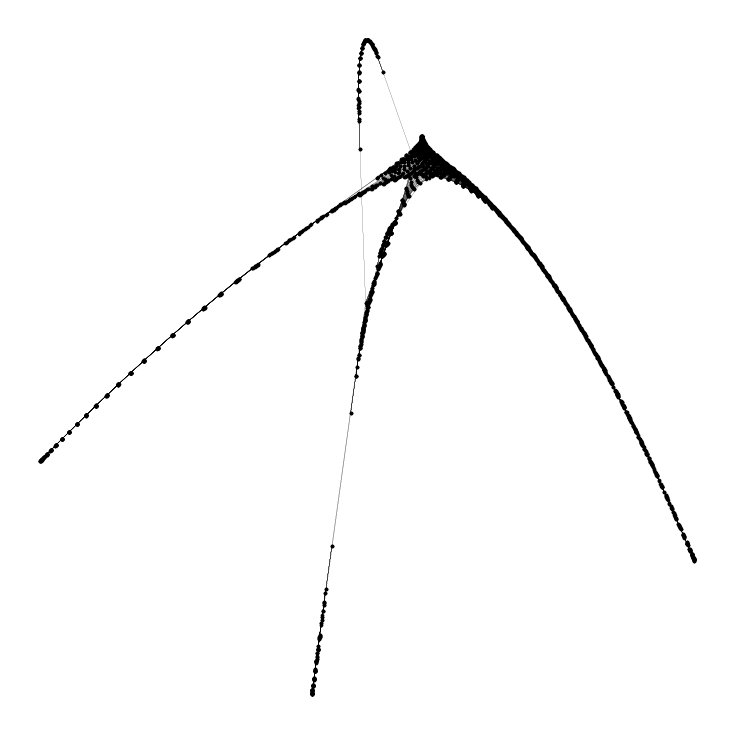

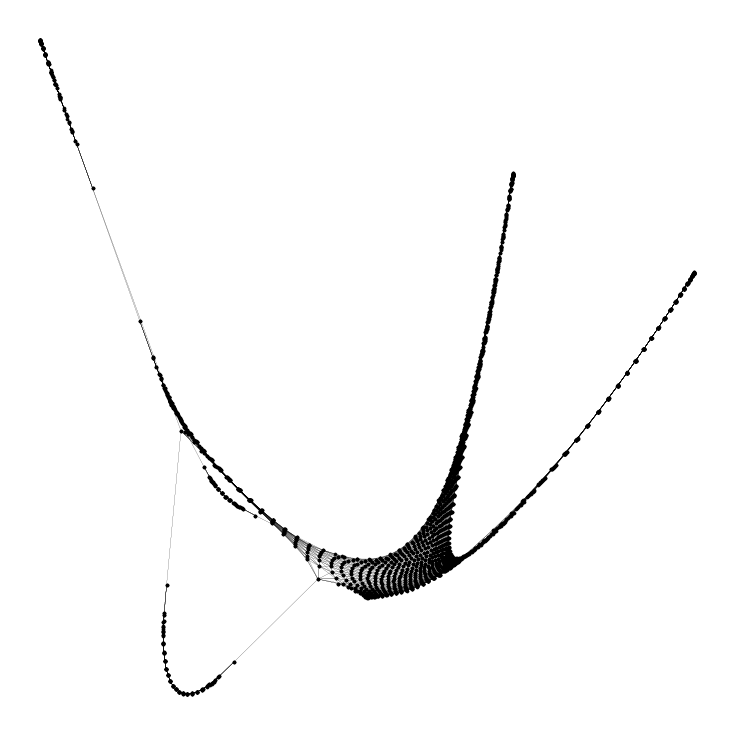

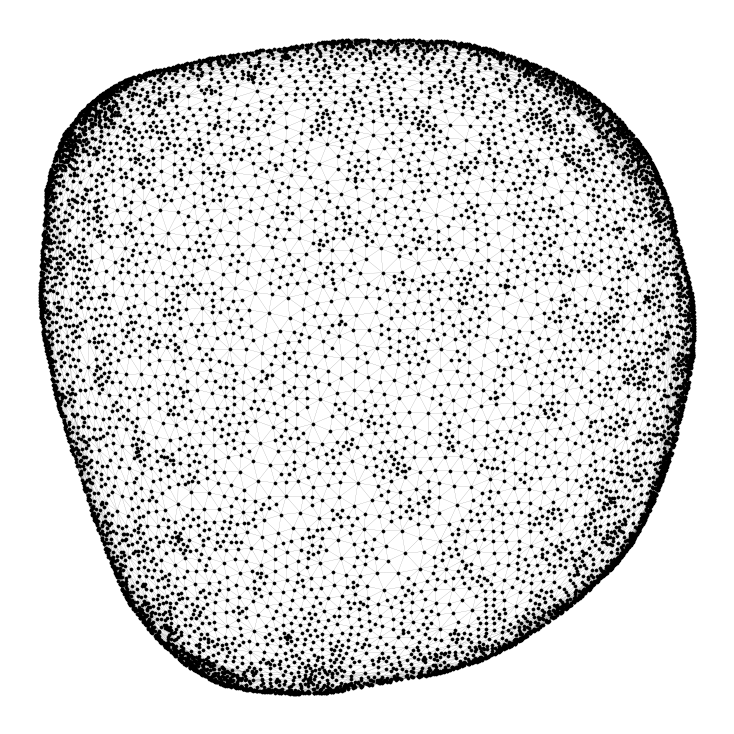

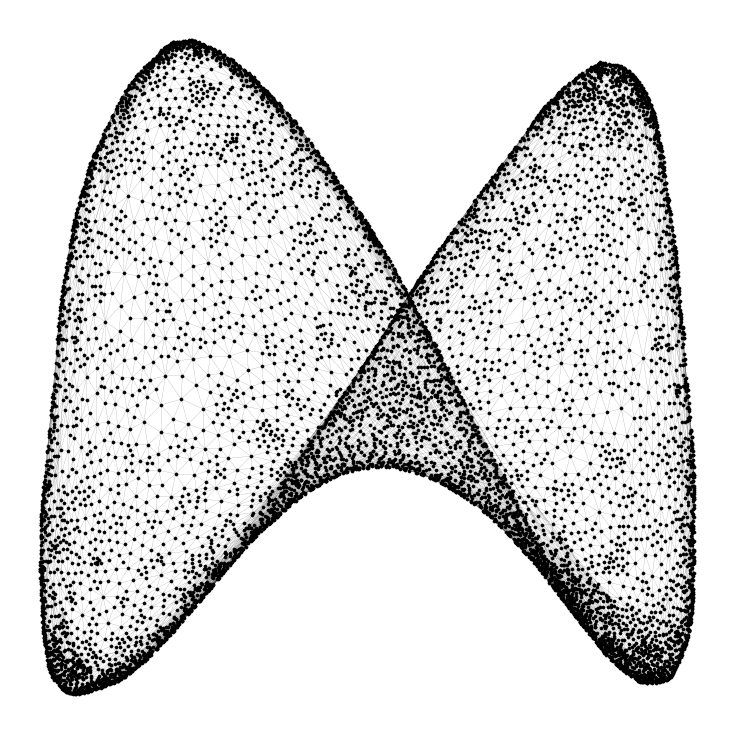

...

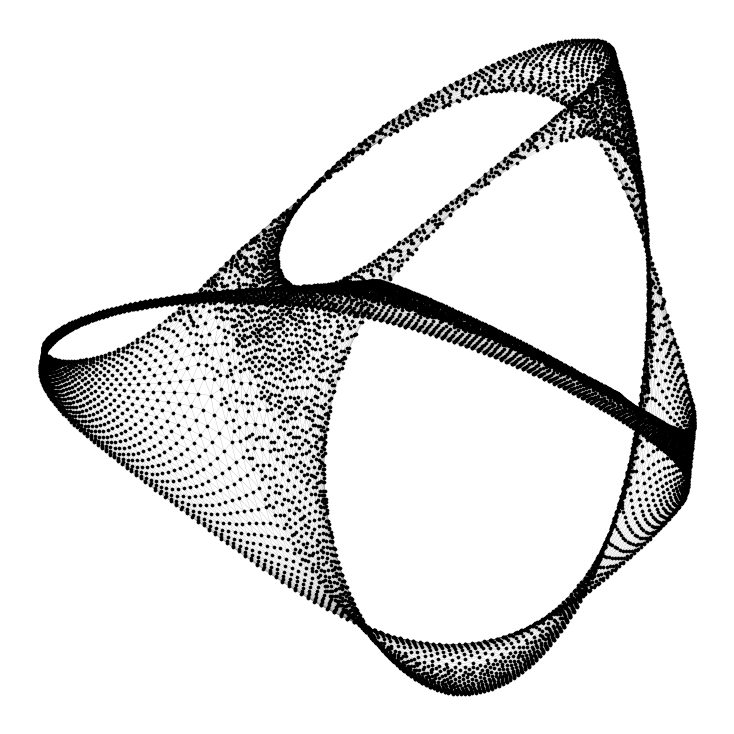

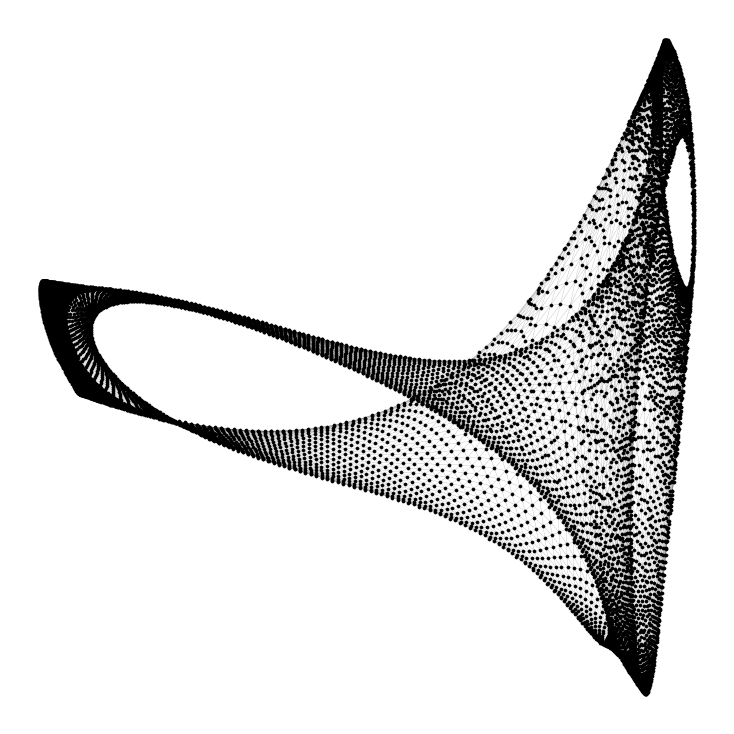

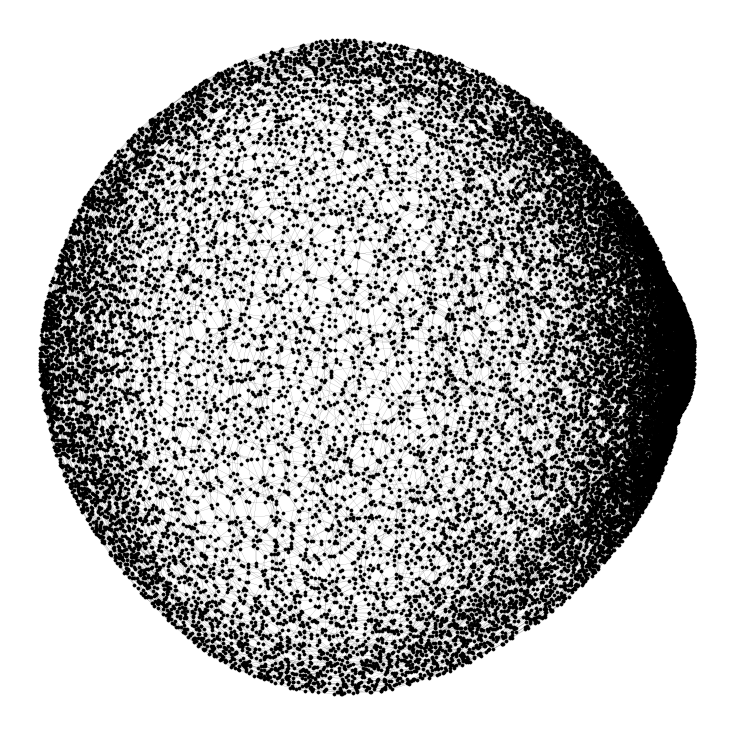

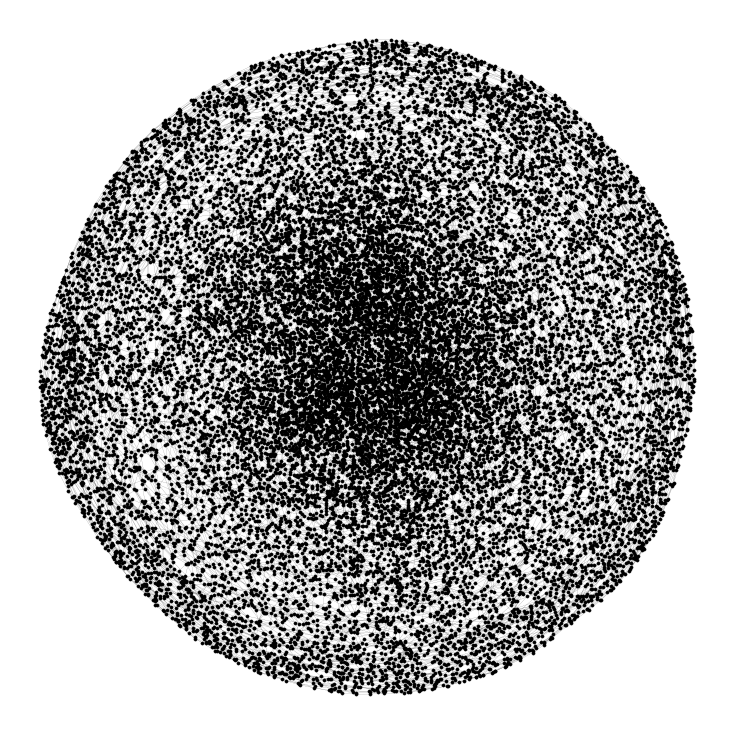

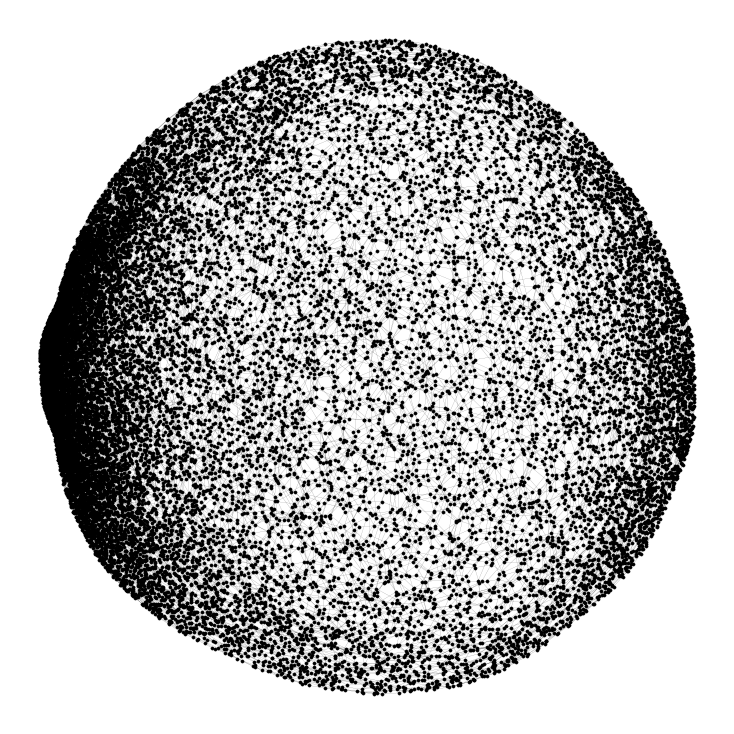

In [9]:
options = {
    "node_color": "black",
    "node_size": 10,
    "linewidths": 0.5,
    "width": 0.1,
}

for i in range(4):
    draw_different_eig(list_of_graphs[i], i, 2, 3)
    draw_different_eig(list_of_graphs[i], i, 3, 4)
    draw_different_eig(list_of_graphs[i], i, 2, 4)

In [10]:
metrics_hall = [[], [], []]

def metrics_Hall_diff(G, n, m):
    MSG = 0
    a = Hall_different(G, n, m)
    tri = Delaunay(a)
    indptr, indices = tri.vertex_neighbor_vertices
    n = G.shape[0]
    H = scipy.sparse.lil_matrix(G).rows
    for i in range(n):
        N1 = set(H[i])
        N2 = set(indices[indptr[i]:indptr[i + 1]])
        intersection = N1.intersection(N2)
        union = N1.union(N2)
        MSG += len(intersection) / len(union)
    MSG /= n
    return MSG

for i in range(4):
    temp = metrics_Hall_diff(list_of_graphs[i], 2, 3)
    metrics_hall[0].append(temp)
    temp = metrics_Hall_diff(list_of_graphs[i], 3, 4)
    metrics_hall[1].append(temp)
    temp = metrics_Hall_diff(list_of_graphs[i], 2, 4)
    metrics_hall[2].append(temp)

In [11]:
save_obj(metrics_hall, 'hall_different_eig')

### Metrics

In [13]:
quality_measurements = {}
Hall_pos = []
koren_pos = []
tutte_pos = []

#### Hall

In [14]:
metrics = []
for G in list_of_graphs:
    MSG = 0
    a = Hall(G, "")
    Hall_pos.append(a)
    tri = Delaunay(a)
    indptr, indices = tri.vertex_neighbor_vertices
    n = G.shape[0]
    H = scipy.sparse.lil_matrix(G).rows
    print("finished triangulation")
    for i in range(n):
        N1 = set(H[i])
        N2 = set(indices[indptr[i]:indptr[i + 1]])
        intersection = N1.intersection(N2)
        union = N1.union(N2)
        MSG += len(intersection) / len(union)
    MSG /= n
    metrics.append(MSG)
print(metrics)
quality_measurements["Hall"] = metrics

finished triangulation
finished triangulation
finished triangulation
finished triangulation
finished triangulation
finished triangulation
finished triangulation
finished triangulation
finished triangulation
[0.14765988381651496, 0.5369444627998308, 0.19584125772368946, 0.051022335862771086, 0.22659892929938977, 0.20472433762013323, 0.10992477601809758, 0.05764114486005137, 0.04861238152472739]


In [15]:
save_obj(metrics, 'Hall')

#### Koren

In [16]:
metrics = []
for G in list_of_graphs:
    MSG = 0
    a = koren(G)
    koren_pos.append(a)
    tri = Delaunay(a)
    indptr, indices = tri.vertex_neighbor_vertices
    n = G.shape[0]
    H = scipy.sparse.lil_matrix(G).rows
    print("finished triangulation")
    for i in range(n):
        N1 = set(H[i])
        N2 = set(indices[indptr[i]:indptr[i + 1]])
        intersection = N1.intersection(N2)
        union = N1.union(N2)
        MSG += len(intersection) / len(union)
    MSG /= n
    metrics.append(MSG)
print(metrics)
quality_measurements["koren"] = metrics

finished triangulation
finished triangulation
finished triangulation
finished triangulation
finished triangulation
finished triangulation
finished triangulation
finished triangulation
finished triangulation
[0.1614948500327821, 0.4487197158234675, 0.1951176136170953, 0.05048256162305484, 0.2639672138245388, 0.14016319779936962, 0.10521740916412682, 0.05711181546884887, 0.052100762102938854]


In [17]:
save_obj(metrics, 'koren')

#### Tutte

In [18]:
metrics = []
for G in list_of_graphs:
    MSG = 0
    graph = nx.from_scipy_sparse_matrix(G)
    pos = tutte(graph, graph.edges)
    tutte_pos.append(pos)
    tri = Delaunay(list(pos.values()))
    indptr, indices = tri.vertex_neighbor_vertices
    n = G.shape[0]
    H = scipy.sparse.lil_matrix(G).rows
    print("finished triangulation")
    for i in range(n):
        N1 = set(H[i])
        N2 = set(indices[indptr[i]:indptr[i + 1]])
        intersection = N1.intersection(N2)
        union = N1.union(N2)
        MSG += len(intersection) / len(union)
    MSG /= n
    metrics.append(MSG)
print(metrics)
quality_measurements["tutte"] = metrics

finished triangulation
finished triangulation
finished triangulation
finished triangulation
finished triangulation
finished triangulation
finished triangulation
finished triangulation
finished triangulation
[0.1074041716713221, 0.06119340725464504, 0.023597327853717348, 0.0012870556361378167, 0.07742666521128846, 0.07786219090448063, 0.020047514837794343, 0.0012254793813646014, 0.0033467470818388163]


In [19]:
save_obj(metrics, 'tutte')

In [20]:
print(quality_measurements)

{'simple': [0.14765988381651496, 0.5369444627998308, 0.19584125772368946, 0.051022335862771086, 0.22659892929938977, 0.20472433762013323, 0.10992477601809758, 0.05764114486005137, 0.04861238152472739], 'koren': [0.1614948500327821, 0.4487197158234675, 0.1951176136170953, 0.05048256162305484, 0.2639672138245388, 0.14016319779936962, 0.10521740916412682, 0.05711181546884887, 0.052100762102938854], 'tutte': [0.1074041716713221, 0.06119340725464504, 0.023597327853717348, 0.0012870556361378167, 0.07742666521128846, 0.07786219090448063, 0.020047514837794343, 0.0012254793813646014, 0.0033467470818388163]}


In [21]:
save_obj(quality_measurements, 'all')

### Drawing

In [22]:
options = {
    "node_color": "black",
    "node_size": 10,
    "linewidths": 0.5,
    "width": 0.1,
}

In [23]:
def draw(G, i):
    graph = nx.from_scipy_sparse_matrix(G)
    
    pos_Hall = Hall_pos[i] 
    pos_koren =  koren_pos[i]
    pos_tutte = tutte_pos[i]
    name = graph_names[i].split('.')[0]
        
    f = plt.figure(figsize=(10, 10))
    nx.draw(graph, pos=pos_Hall, **options)
    f.savefig(f"images/{name}_Hall.png")
    plt.show()
    f = plt.figure(figsize=(10, 10))
    nx.draw(graph, pos=pos_koren, **options)
    f.savefig(f"images/{name}_koren.png")
    plt.show()
    f = plt.figure(figsize=(10, 10))
    nx.draw(graph, pos=pos_tutte, **options)
    f.savefig(f"images/{name}_tutte.png")

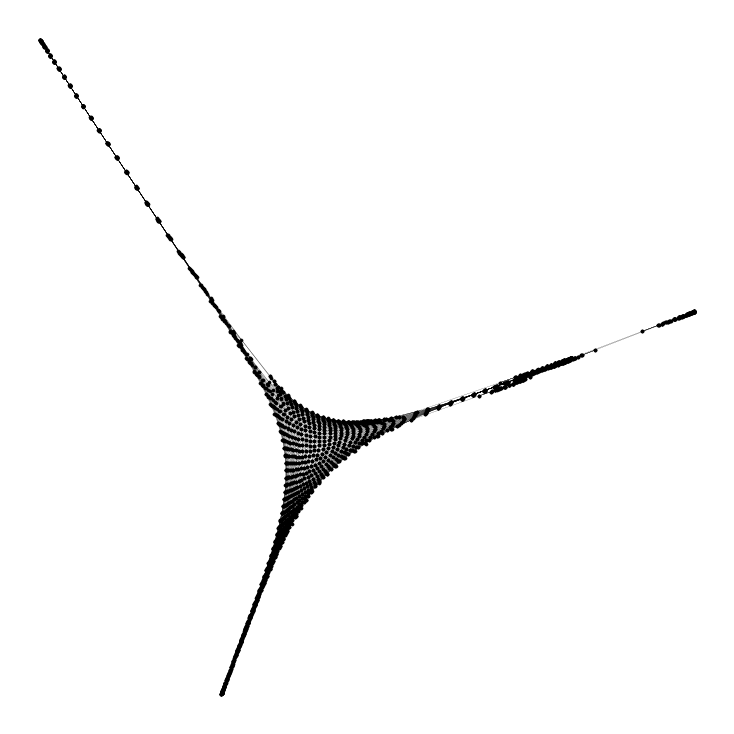

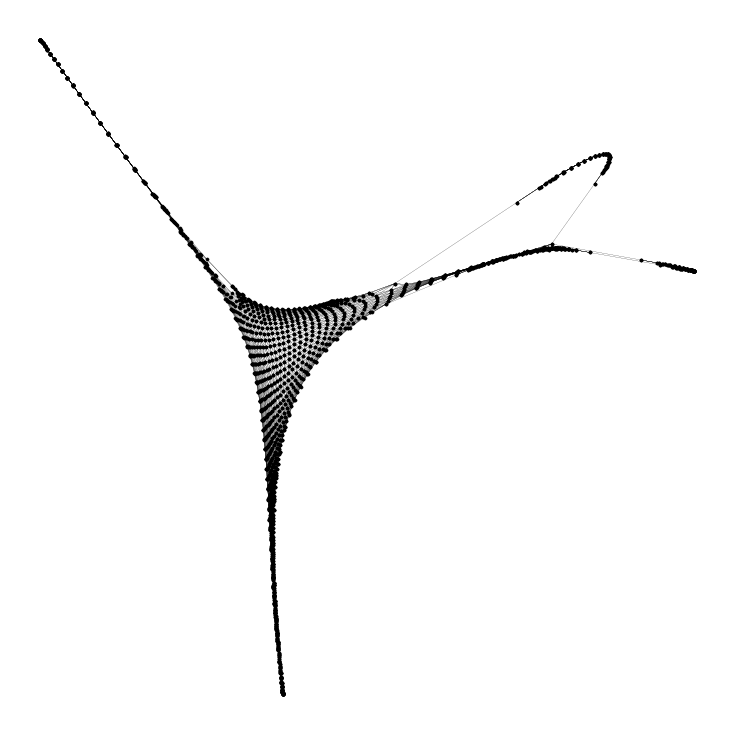

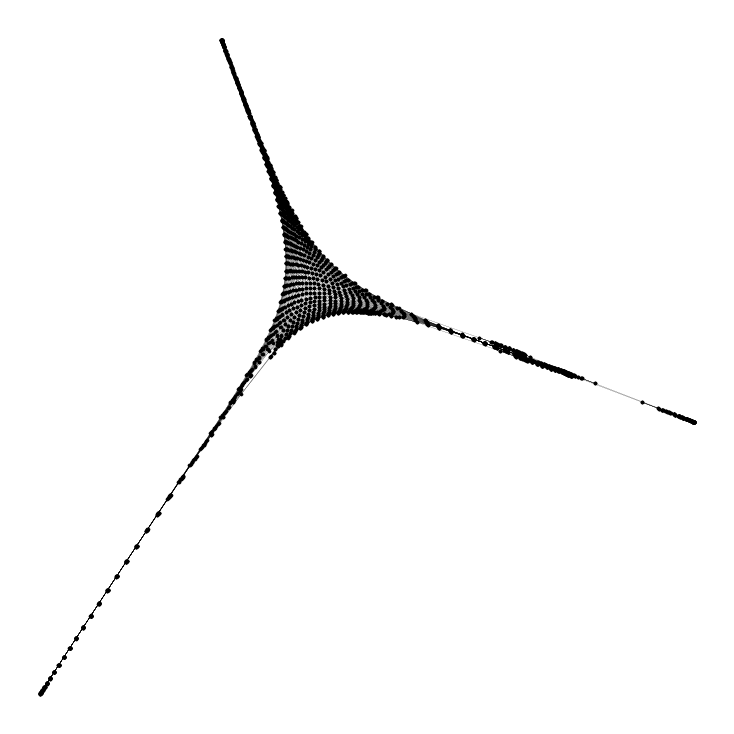

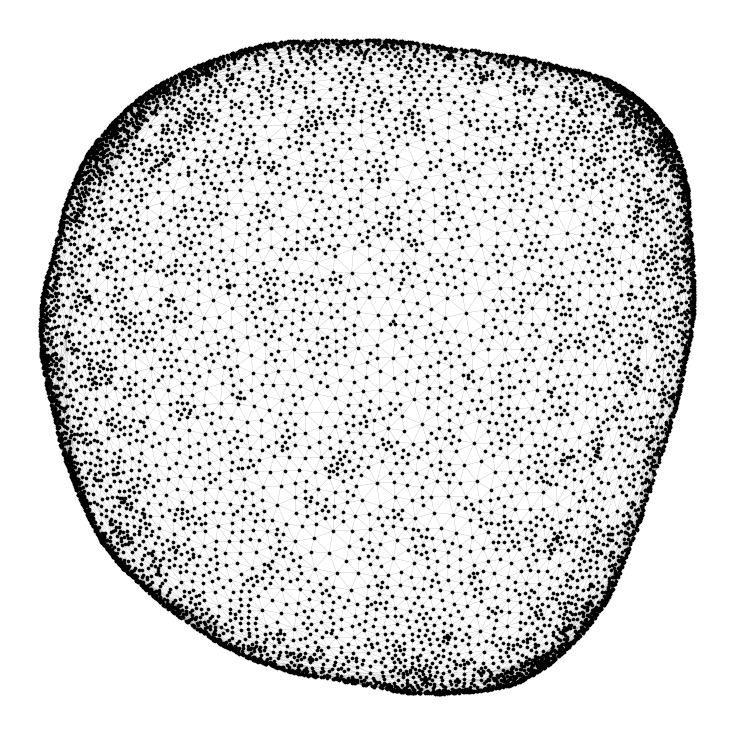

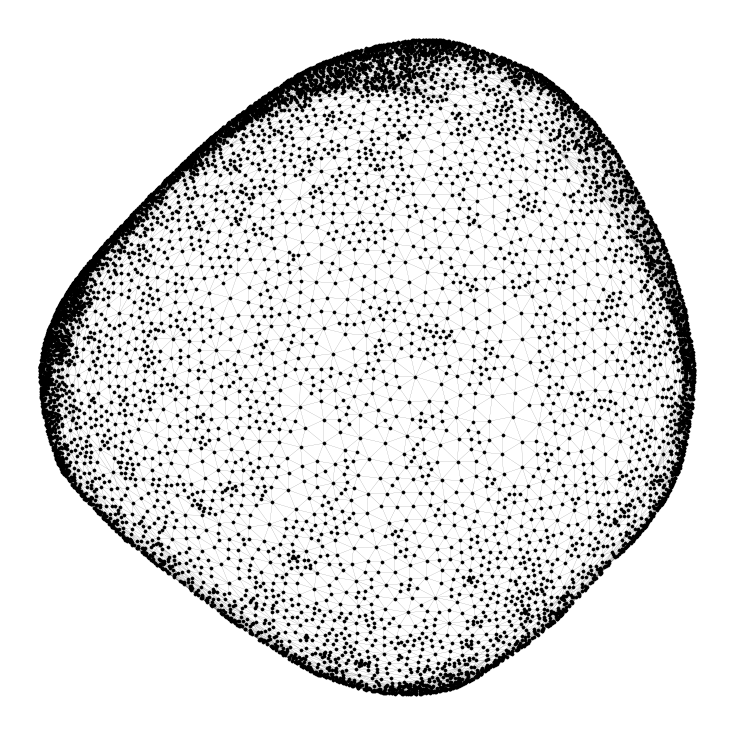

...

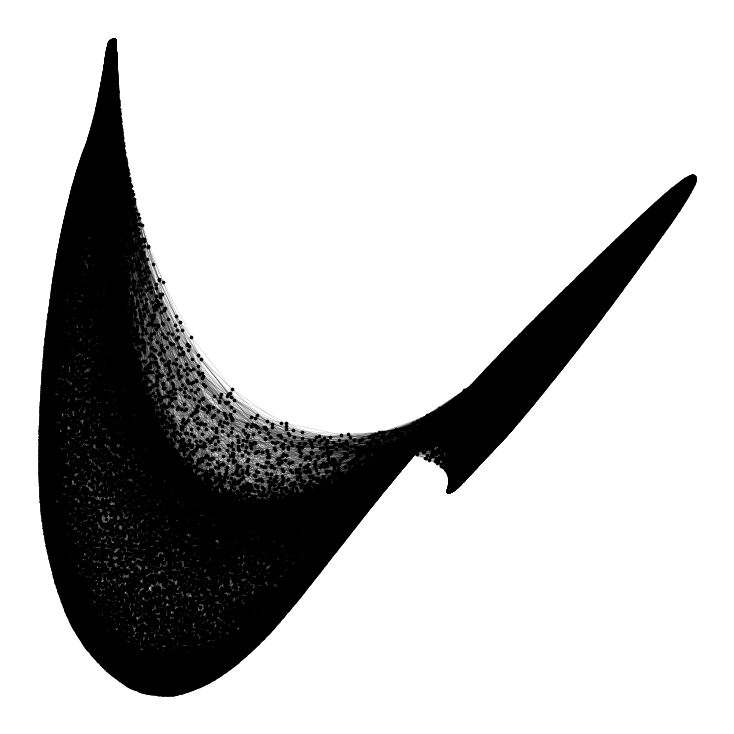

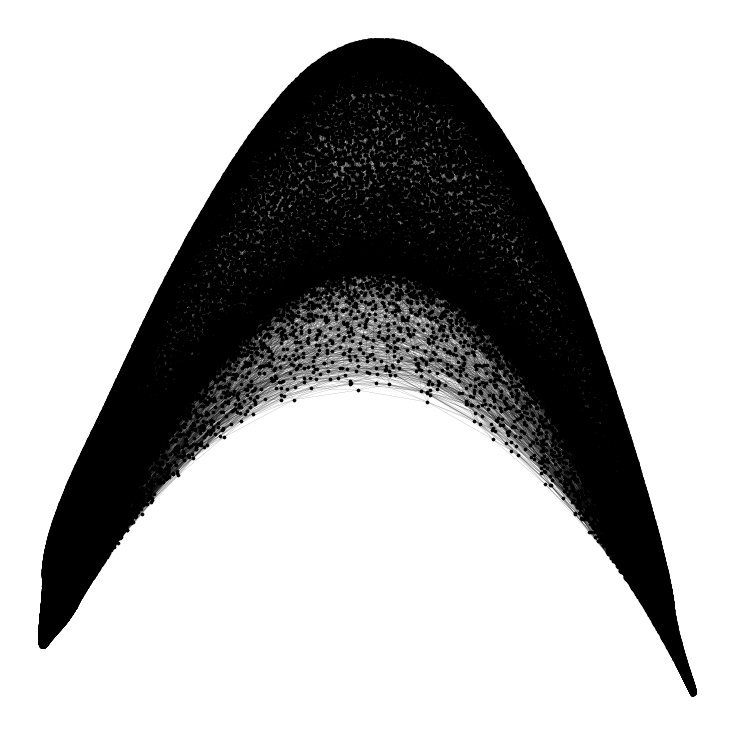

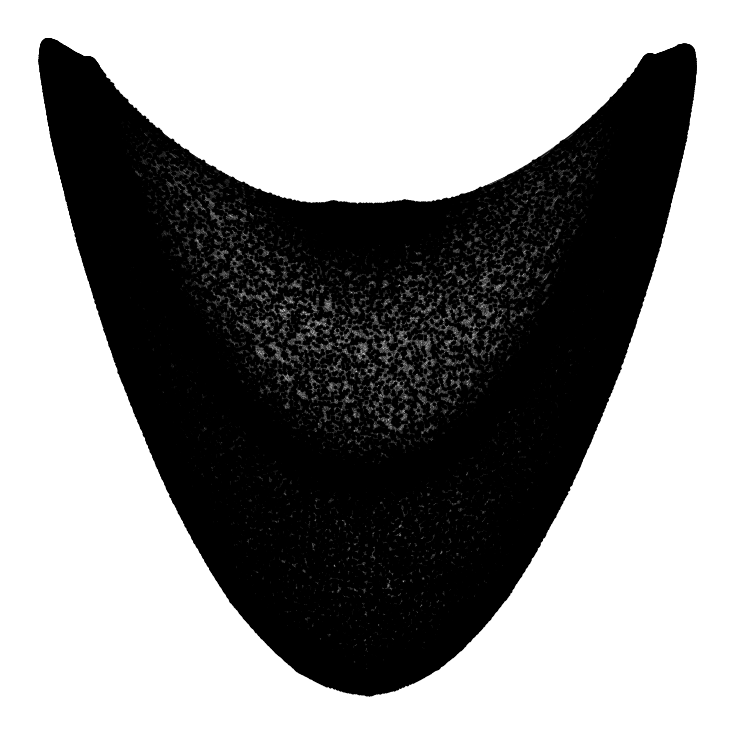

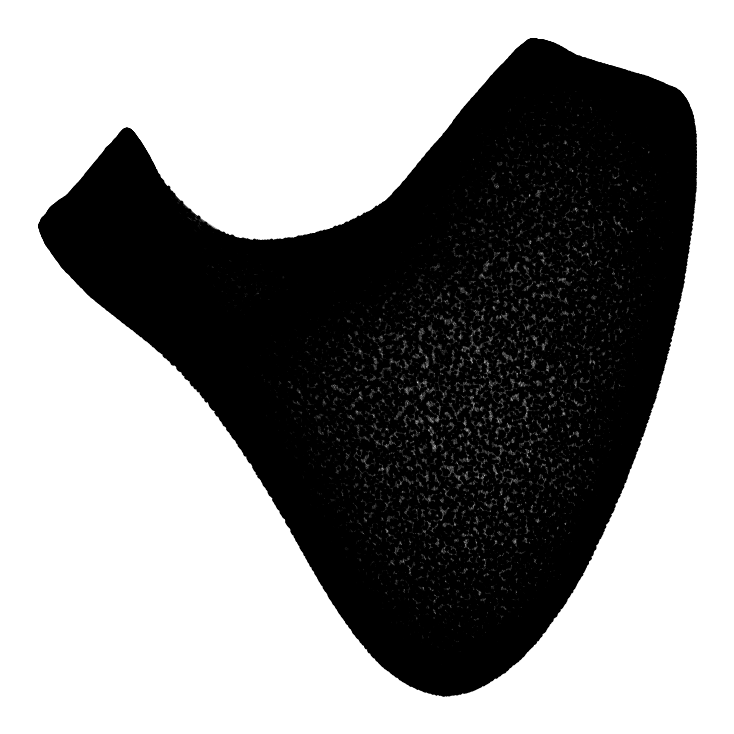

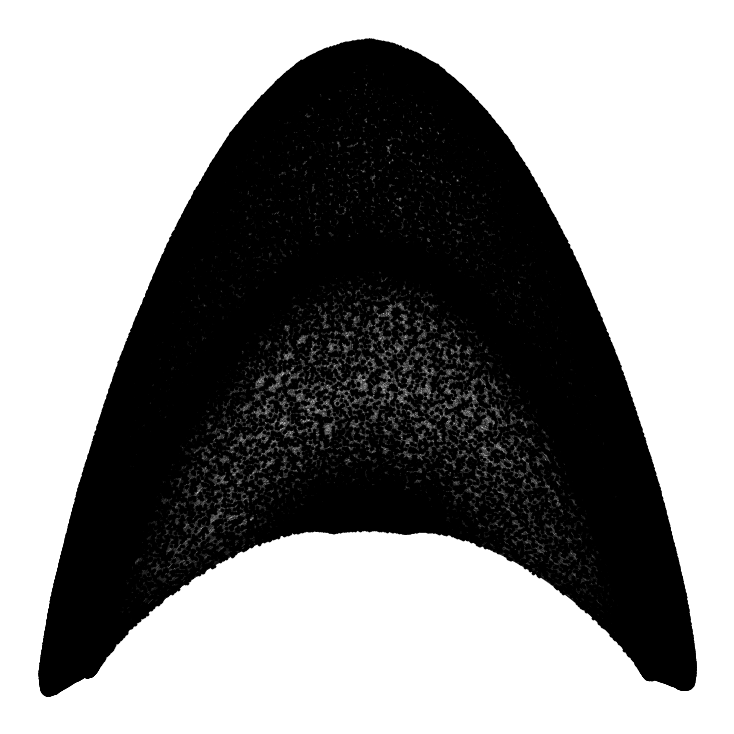

In [24]:
for i in range(len(graph_names)):
    draw(list_of_graphs[i], i)